## Three Model Visualizer

#### Combines TissueFinder, LesionFinder, LesionChecker visuals into one image and outputs metrics about runtime.

In [24]:
# Imports
import os
from pathlib import Path
import sys
from typing import * 
from time import perf_counter

# Hacky way to resolve project paths
sys.path.append(str(Path(os.getcwd()).parents[0]))
sys.path.append(str(Path(os.getcwd()).parents[1]))

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import numpy as np
import tifffile as tf
import torch

from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog
from detectron2.data import transforms as T
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog

import ROI_detection2.utils.train_utils as train_utils

from ubteacher.config import add_ubteacher_config
from ubteacher.engine.trainer import UBRCNNTeacherTrainer
from ubteacher.modeling.meta_arch.rcnn import TwoStagePseudoLabGeneralizedRCNN
import ubteacher.utils.ROI_utils as ROI_utils

import cv2
import joblib
#import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from pprint import pprint

from tiatoolbox.wsicore.wsireader import WSIReader
from tiatoolbox.models.engine.nucleus_instance_segmentor import NucleusInstanceSegmentor

# We need this function to visualize the nuclear predictions
from tiatoolbox.utils.visualization import (
    overlay_prediction_contours,
)

plt.rcParams["figure.figsize"] = (25, 10)

In [25]:
# TODO: Stop using the with open statements because we want to hold the slide info in memory

In [39]:
image_id = "Case 4 F26"


In [42]:
#Defining all arguments
case_num = float(image_id.split(" ")[1])
if case_num > 11:
    #src_dir = "/mnt/FNX/SynologyDrive/Datasets_pathology/SRI_OSCC_lymph_test/"
    src_dir = "/mnt/MT8/SynologyDrive/SRI_OSCC_lymph_test/"
if case_num < 12:
    #src_dir = "/mnt/FNX/SynologyDrive/Datasets_pathology/SRI_OSCC_lymph_train/"
    src_dir = "/mnt/MT8/SynologyDrive/SRI_OSCC_lymph_train/"
image_ext = ".svs"
image_file = os.path.join(src_dir, image_id+image_ext)

# Tissue Finder Model
tf_parent = '/home/chao_lab/SynologyDrive/chaolab_AI_path/ROI_detection2/outputs/ROIdet-multi_20230906/'
tf_model = tf_parent + 'model_0184999.pth'
tf_config = tf_parent + 'config.yaml'
max_dim = 800

# Lesion Finder Model

lf_parent = '/home/chao_lab/SynologyDrive/chaolab_AI_path/unbiased_teacher2/output/'
lf_model = lf_parent + 'model_0079999.pth'
lf_config = lf_parent + 'config.yaml'

In [28]:
#TMA time
#src_dir = "/mnt/MT8/SynologyDrive/BCCan_OC_TMA"
#image_id = "TMA06-01_HE_RI"
#image_ext = ".tif"
#image_file = os.path.join(src_dir, image_id+image_ext)
#max_dim = 2000

#### Helper Functions

In [29]:
def search_recursive(d: Dict, key: str) -> Iterator:
    """Helper function for finding which level of json annotations has
    the matching key.
    """
    for k, v in d.items():
        if isinstance(v, Dict):
            for match in search_recursive(v, key):
                yield match
        if k == key:
            # generator function - saves in memory until called
            # (use for loop to call)
            yield v

In [30]:
def get_thumbnail(image_file, max_dim=2560):
    with tf.TiffFile(image_file) as slide:
        # Get image thumbnail
        image_thumbnail = train_utils.TrainUtil(max_dim).find_top(slide)
        # Set image dimension attributes
        target_dim = image_thumbnail.shape
        base_dim = slide.series[0].levels[0].shape
        base_dim = train_utils.channel_last(base_dim)
    return image_thumbnail, base_dim, target_dim

In [31]:
def box_at_max_dim(image_file, box, base_dim, target_dim, max_dim=2560):
    
    box = list(box)
    box_base = train_utils.scale_bboxes([box], target_dim, base_dim)[0]
    
    with tf.TiffFile(image_file) as slide:
        x1, y1, x2, y2 = box_base

        if len(slide.series[0].levels) > 1:
            pyramid_reader = slide.series[0].levels
        else:
            pyramid_reader = slide.pages
        for level_idx, level in enumerate(pyramid_reader):
            level_dim = train_utils.channel_last(level.shape)
            level_crop = train_utils.scale_bboxes([box_base], base_dim, level_dim)[0]
            cx1, cy1, cx2, cy2 = [int(i) for i in level_crop]
            crop_w = cx2-cx1
            crop_h = cy2-cy1
            crop_long_edge = max(crop_w, crop_h)
            
            if crop_h>max_dim or crop_w>max_dim:
                target_level = level_idx
                continue
            else:
                target_level = level_idx - 1
                break
            
        input_image = pyramid_reader[target_level].asarray()
        input_image = train_utils.channel_last(input_image)
        
        recrop_coord = train_utils.scale_bboxes([box_base], base_dim, input_image.shape)[0]
        rx1, ry1, rx2, ry2 = [int(i) for i in recrop_coord]
        recropper = T.CropTransform(rx1, ry1, rx2-rx1, ry2-ry1)
        recropped_tissue = recropper.apply_image(input_image)
        # Resize crop if necessary
        if recropped_tissue.shape[0]>max_dim or recropped_tissue.shape[1]>max_dim:
           # print("        ", 
                 # f"this tissue crop is bigger than {max_dim}px",
                 #  "and will be downsampled")
            recropped_tissue = train_utils.resize_image(recropped_tissue, max_dim)
            
        tissue_anno_dict = {
                "file_name": image_file,
                "image_width" : recropped_tissue.shape[1],
                "image_height" : recropped_tissue.shape[0],
                "max_dim": max_dim,
                "annotations": []
        }
        
        return recropped_tissue, tissue_anno_dict

In [32]:
def scale_poly(base_img_shape: np.ndarray, 
               target_img_shape: np.ndarray or tuple, 
               polygon: np.ndarray) -> np.ndarray:
    """Scale an input polygon to the desired image dimension
    Args:
    base_img_shape -- shape of input image, channel last (if present)
    target_img_shape -- shape of target image, channel last (if present)
    Return:
    scaled_polygon
    """
    base_long_edge = max(base_img_shape[0], base_img_shape[1])
    target_long_edge = max(target_img_shape[0], target_img_shape[1])
    scale_factor = round(target_long_edge/ base_long_edge, 3)
    scaled_polygon = np.multiply(polygon, scale_factor)
    return np.array(np.int32(scaled_polygon))

In [33]:
def polygon2bbox(polygon: np.ndarray, pad: float=0.02) -> List:
    """Convert segmentation polygons to 
    bounding boxes. Add padding
    Args:
    polygon -- segmentation polygon
    padding -- fraction of the original width
                to pad the boxes by
    Returns:
    box in XYXY
    """
    # Grab bounding box from polygon
    x0 = min(polygon[:, 0])
    y0 = min(polygon[:, 1])
    x1 = max(polygon[:, 0])
    y1 = max(polygon[:, 1])
    w = x1 - x0
    h = y1 - y0
    # Add padding
    x0 = max(0, x0-w*pad)
    x1 = x1 + w*pad
    y0 = max(0, y0-h*pad)
    y1 = y1 + h*pad
    return [x0, y0, x1, y1]

In [34]:
def search_recursive(d: Dict, key: str) -> Iterator:
    """Helper function for finding which level of json annotations has
    the matching key.
    """
    for k, v in d.items():
        if isinstance(v, Dict):
            for match in search_recursive(v, key):
                yield match
        if k == key:
            # generator function - saves in memory until called
            # (use for loop to call)
            yield v

#### TissueFinder

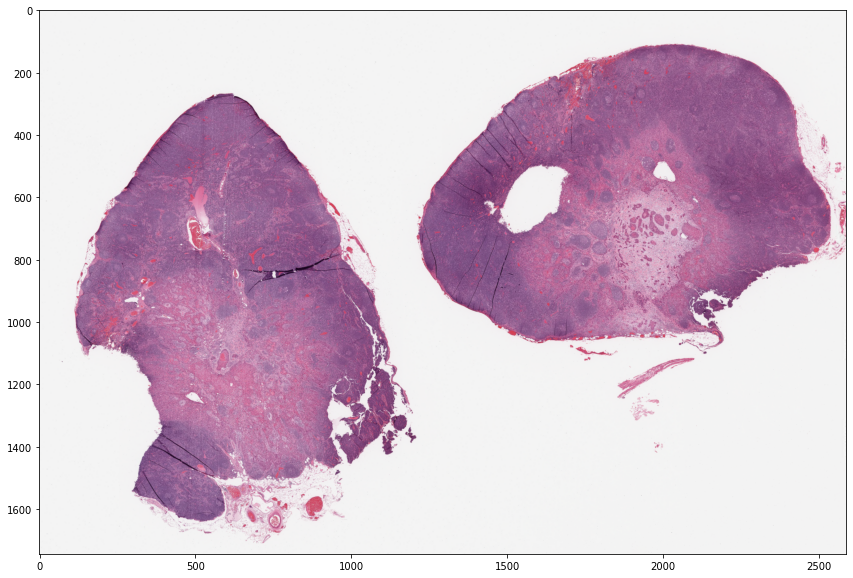

In [43]:
plt.imshow(get_thumbnail(image_file)[0])
plt.show()
plt.close()

In [45]:
# Load tf config
cfg_tic = perf_counter()
cfg = get_cfg()
add_ubteacher_config(cfg)
cfg.CATEGORICAL_MAP = []
cfg.DETECTION_MODE = ""
cfg.MODEL.ROI_BOX_HEAD.FED_LOSS_FREQ_WEIGHT_POWER = 0.0
cfg.MODEL.ROI_BOX_HEAD.FED_LOSS_NUM_CLASSES = 1
cfg.MODEL.ROI_BOX_HEAD.USE_FED_LOSS = False
cfg.MODEL.ROI_BOX_HEAD.USE_SIGMOID_CE = False
cfg.SOLVER.BASE_LR_END = 0.005
cfg.SOLVER.NUM_DECAYS = 1
cfg.SOLVER.RESCALE_INTERVAL = False
cfg.merge_from_file(os.path.join(tf_parent, "config.yaml"))
cfg.MODEL.WEIGHTS = tf_model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1
predictor = DefaultPredictor(cfg)
cfg_toc = perf_counter()
print(f"Loaded tf config in {cfg_toc-cfg_tic:0.4f} seconds")

|2023-10-15|13:59:46.871| [INFO] [Checkpointer] Loading from /home/chao_lab/SynologyDrive/chaolab_AI_path/ROI_detection2/outputs/ROIdet-multi_20230906/model_0184999.pth ...
Loaded tf config in 0.4809 seconds


In [46]:
def find_tissues_and_vis(img, max_dim):
    tic = perf_counter()
    
    img_name = os.path.basename(img).split('.')[0]
    print(img_name)
    
    image_thumbnail, base_dim, thumb_dim = get_thumbnail(img, max_dim=max_dim)
    
    tac = perf_counter()
    
    outputs = predictor(image_thumbnail)

    # Get predictions
    with torch.no_grad():
        predictions = outputs["instances"].to("cpu")
    boxes = predictions.pred_boxes.tensor.numpy()
    
    if len(boxes) == 0:
        print("    No tissues found")
        return image_thumbnail
    
    toc = perf_counter()
    
    tissues = []
    
    plotting_tic = perf_counter()
    
    if len(boxes) == 1:
        tissue, tissue_anno_dict = box_at_max_dim(img, boxes[0], base_dim, thumb_dim, max_dim)
        tissues.append(tissue)
        plt.imshow(tissue)
        plt.axis('off')
        return tissues, boxes
    
    fig, axs = plt.subplots(1, len(boxes))
    for n, box in enumerate(boxes):
        tissue, tissue_anno_dict = box_at_max_dim(img, box, base_dim, thumb_dim, max_dim)
        tissues.append(tissue)
        #plot each tissue to a subplot using enumerate
        axs[n].imshow(tissue)
        axs[n].set_axis_off()
        
    plotting_toc = perf_counter()
    
    

    print(f"    Time to load image: {tac-tic:0.4f} seconds")
    print(f"    Time to find tissues: {toc-tac:0.4f} seconds")
    print(f"    Time to plot image: {plotting_toc-plotting_tic:0.4f} seconds")
    
    
    return tissues, boxes

TMA06-01_HE_RI


|2023-10-15|13:59:51.808| [WARNING] /home/chao_lab/miniconda3/envs/ssod/lib/python3.8/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]



    Time to load image: 0.4828 seconds
    Time to find tissues: 1.8470 seconds
    Time to plot image: 3.6925 seconds


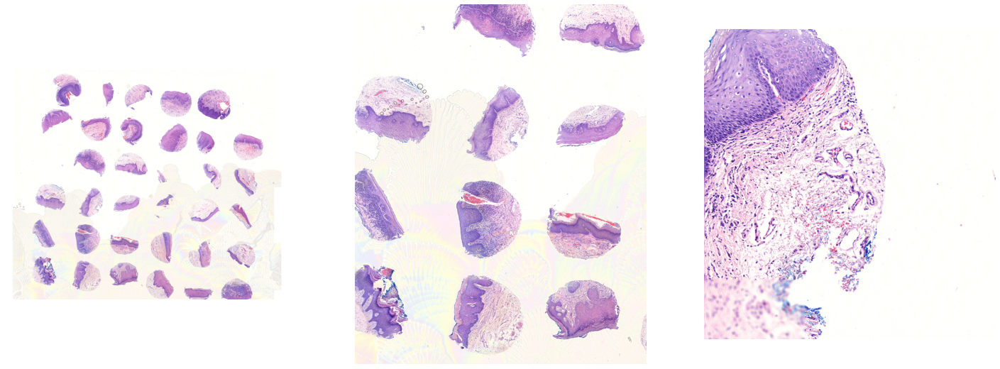

In [47]:
try:
    tissues, boxes = find_tissues_and_vis(image_file, max_dim=2560)
except:
    tissues = find_tissues_and_vis(image_file, max_dim=2560) 
    tissues = [tissues]
    #Temporary error handling if tissuefinder fails

#### LesionFinder

In [15]:
# Load trained model from config and weights
cfg_tic = perf_counter()
cfg = get_cfg()
add_ubteacher_config(cfg)
cfg.PARENTDIR = ""
cfg.DETECTION_MODE = ""
cfg.DATASEED = ""
cfg.MODEL.ROI_BOX_HEAD.BATCH_SIZE_PER_IMAGE = 4
cfg.MODEL.ROI_BOX_HEAD.NUM_CLASSES = 4
cfg.MODEL.RPN.NUM_CLASSES = 4
cfg.merge_from_file(lf_config)
cfg.MODEL.WEIGHTS = lf_model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1

predictor = DefaultPredictor(cfg)

cfg_toc = perf_counter()
print(f"Loaded lf config in {cfg_toc-cfg_tic:0.4f} seconds")

|2023-10-14|12:15:11.584| [INFO] [DetectionCheckpointer] Loading from /home/chao_lab/SynologyDrive/chaolab_AI_path/unbiased_teacher2/output/model_0079999.pth ...
|2023-10-14|12:15:11.584| [INFO] [Checkpointer] Loading from /home/chao_lab/SynologyDrive/chaolab_AI_path/unbiased_teacher2/output/model_0079999.pth ...


|2023-10-14|12:15:11.774| [WARNING] Some model parameters or buffers are not found in the checkpoint:
backbone.bottom_up.res2.0.conv1.norm.{bias, weight}
backbone.bottom_up.res2.0.conv1.weight
backbone.bottom_up.res2.0.conv2.norm.{bias, weight}
backbone.bottom_up.res2.0.conv2.weight
backbone.bottom_up.res2.0.conv3.norm.{bias, weight}
backbone.bottom_up.res2.0.conv3.weight
backbone.bottom_up.res2.0.shortcut.norm.{bias, weight}
backbone.bottom_up.res2.0.shortcut.weight
backbone.bottom_up.res2.1.conv1.norm.{bias, weight}
backbone.bottom_up.res2.1.conv1.weight
backbone.bottom_up.res2.1.conv2.norm.{bias, weight}
backbone.bottom_up.res2.1.conv2.weight
backbone.bottom_up.res2.1.conv3.norm.{bias, weight}
backbone.bottom_up.res2.1.conv3.weight
backbone.bottom_up.res2.2.conv1.norm.{bias, weight}
backbone.bottom_up.res2.2.conv1.weight
backbone.bottom_up.res2.2.conv2.norm.{bias, weight}
backbone.bottom_up.res2.2.conv2.weight
backbone.bottom_up.res2.2.conv3.norm.{bias, weight}
backbone.bottom_up.re

Loaded lf config in 0.5827 seconds


Instances(num_instances=0, image_height=2040, image_width=2569, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=torch.int64), pred_boxes_std: tensor([], size=(0, 4))])
Instances(num_instances=0, image_height=2580, image_width=2090, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=torch.int64), pred_boxes_std: tensor([], size=(0, 4))])
Instances(num_instances=0, image_height=2570, image_width=2413, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=torch.int64), pred_boxes_std: tensor([], size=(0, 4))])


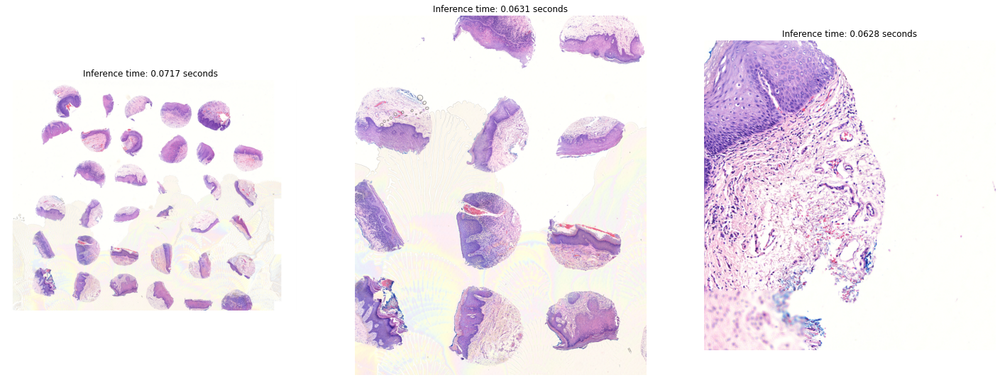

    Time to find lesions: 0.1975 seconds
   Time to plot image: 0.7410 seconds


In [16]:
fig, axs = plt.subplots(1, len(tissues))

clock = 0

for i in range(len(tissues)):
    
    tic = perf_counter()
    
    with torch.no_grad():
        outputs = predictor(tissues[i])
    instances = outputs["instances"].to("cpu")
    print(instances)
    pred_class = instances.pred_classes.numpy()
    
    tac = perf_counter()
    
    clock += tac-tic
    
    if len(tissues) == 1:
        axs.imshow(tissues[i])
        axs.set_axis_off()
        for box in instances.pred_boxes.tensor.numpy():
            x1, y1, x2, y2 = box
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=3, edgecolor='r', facecolor='none')
            axs.add_patch(rect)
        axs.set_title(f"Inference time: {tac-tic:0.4f} seconds")
        plt.show(); plt.close()
        break

    axs[i].imshow(tissues[i])
    axs[i].set_axis_off()

    for box in instances.pred_boxes.tensor.numpy():
        x1, y1, x2, y2 = box
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=3, edgecolor='r', facecolor='none')
        
        axs[i].add_patch(rect)
    axs[i].set_title(f"Inference time: {tac-tic:0.4f} seconds")
    
plt.show(); plt.close()
    
toc = perf_counter()


print(f"    Time to find lesions: {clock:0.4f} seconds")
print(f"   Time to plot image: {toc-tac:0.4f} seconds")


In [ ]:
# Use tissue finder algorithm instead



#### LesionChecker

In [ ]:
img_file = ''

#### Supplementary

In [17]:
preds = torch.load(lf_parent + 'inference/instances_predictions.pth')
print(preds[1])
# Get predictions

plt.figure(figsize=(20, 20))

pred_imgs = []
pred_box_dict = []

for pred in preds:
    for instance in pred['instances']:
        if instance['score'] > 0.5:
            key = pred['image_id']
            pred_imgs.append(key)
            val = instance['bbox']
            pred_box_dict.append({key: val})

print(pred_box_dict)

gt_dir = '/mnt/FNX/SynologyDrive/Datasets_pathology/GT_2023'

# search recursively to get paths of .npy matching key
gt_paths = []

for p, d, f in os.walk(gt_dir):
    for file in f:
        if file.endswith('.npy'):
            gt_paths.append(os.path.join(p, file))

pred_img_paths = [x for x in gt_paths if any([y in x for y in pred_imgs])]

gt_anno_paths = []

for p, d, f in os.walk(gt_dir):
    for file in f:
        if file.endswith('.json'):
            gt_anno_paths.append(os.path.join(p, file))

gt_img_annos = [x for x in gt_anno_paths if any([y in x for y in pred_imgs])]

{'image_id': 'Case 16 J19_2', 'instances': [{'image_id': 'Case 16 J19_2', 'category_id': 0, 'bbox': [209.55274963378906, 558.2061157226562, 706.6931762695312, 1413.478515625], 'score': 0.234555184841156}, {'image_id': 'Case 16 J19_2', 'category_id': 0, 'bbox': [1531.9564208984375, 414.45941162109375, 87.0693359375, 80.7510986328125], 'score': 0.13101327419281006}, {'image_id': 'Case 16 J19_2', 'category_id': 0, 'bbox': [201.77947998046875, 1468.1954345703125, 602.4517211914062, 429.7808837890625], 'score': 0.11322510987520218}, {'image_id': 'Case 16 J19_2', 'category_id': 0, 'bbox': [1454.7891845703125, 390.0966491699219, 89.6151123046875, 74.85324096679688], 'score': 0.06822597235441208}]}
[{'Case 17 F5_4': [347.3701477050781, 801.1038818359375, 840.927734375, 1434.9754638671875]}, {'Case 9 M4_1': [576.837158203125, 1156.951171875, 358.41363525390625, 327.386962890625]}, {'Case 9 M4_1': [1189.1158447265625, 857.30810546875, 548.4051513671875, 538.49365234375]}, {'Case 9 M4_1': [893.93

<Figure size 1440x1440 with 0 Axes>

Case 22 G4_1


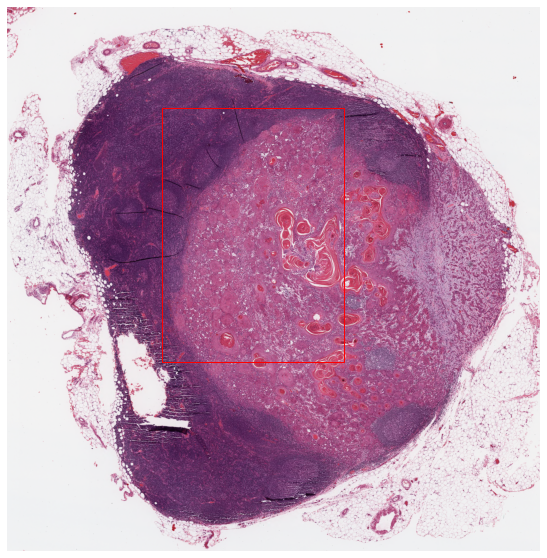

Case 1 J12_1


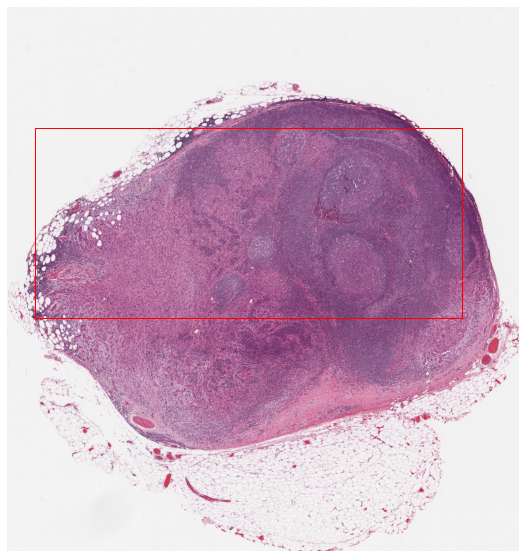

Case 6 B4_0


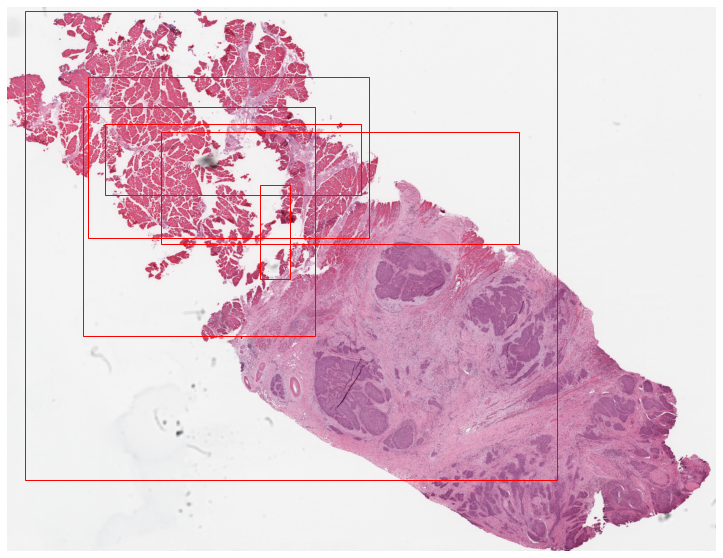

Case 9 M4_1


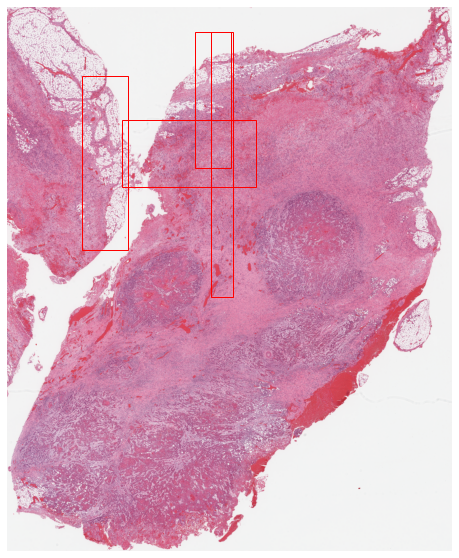

Case 17 F3_1


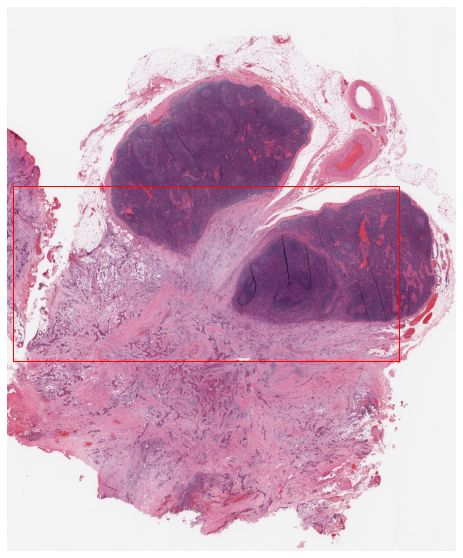

Case 12 I3_2


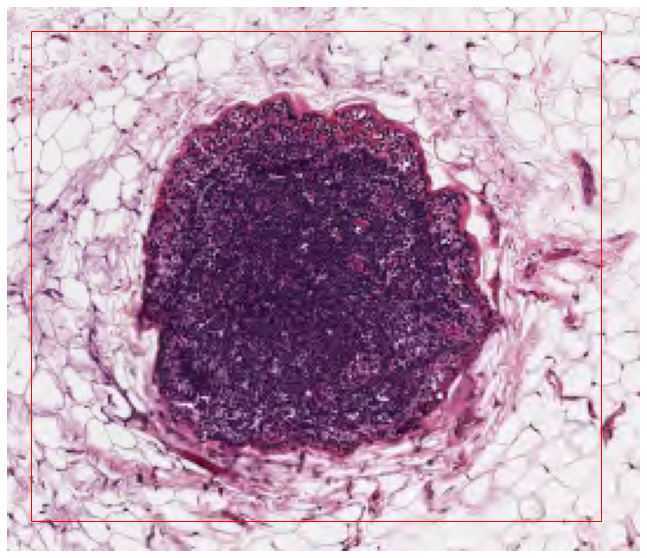

Case 24 B10_0


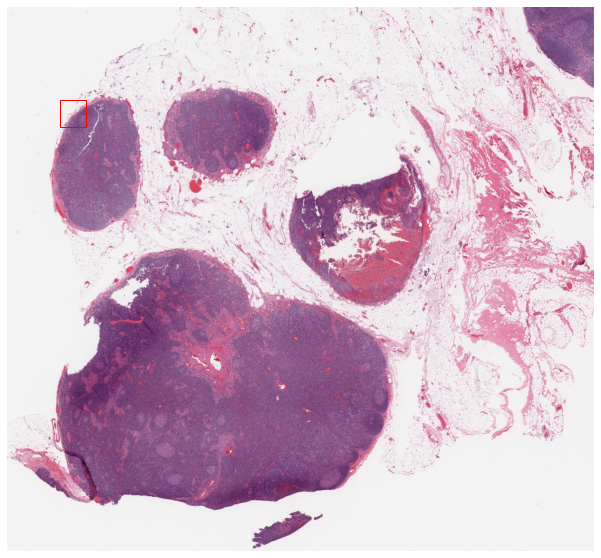

Case 1 J11_0


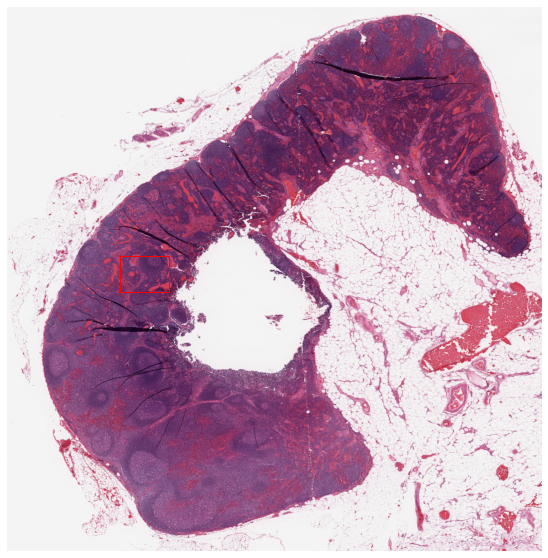

Case 15 B6_0


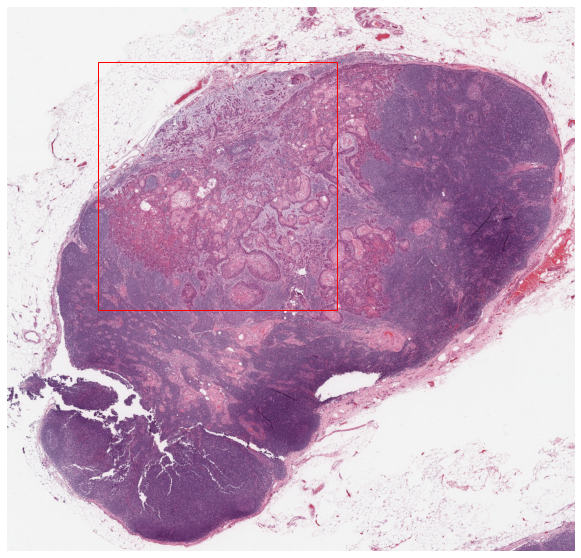

Case 1 G7_1


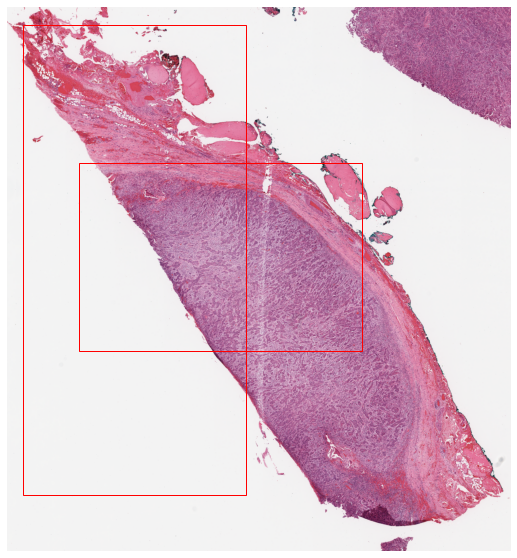

Case 17 F5_4


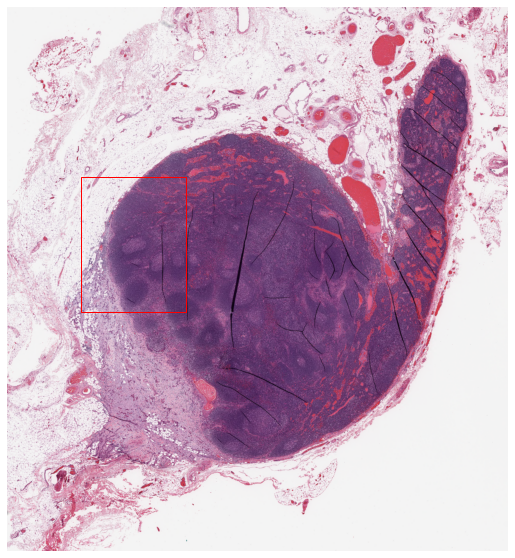

Case 8 I9_1


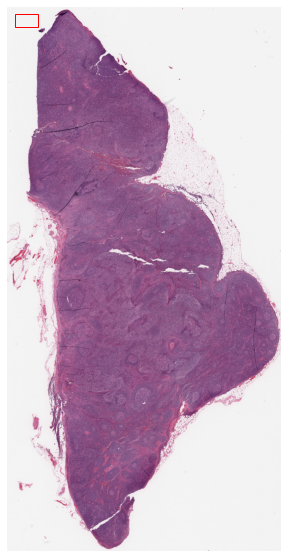

Case 19 E29_0


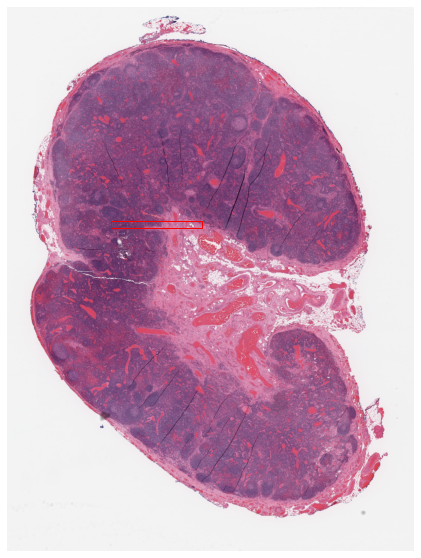

Case 11 G5_1


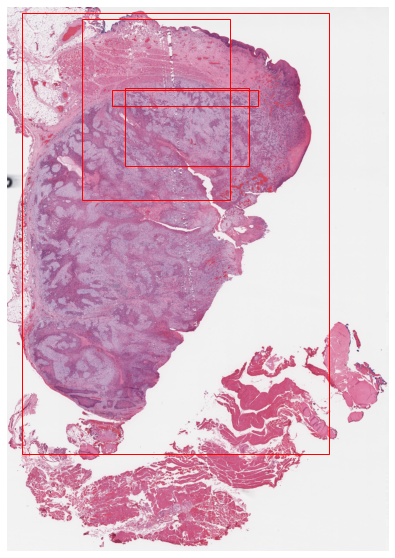

Case 18 G6_0


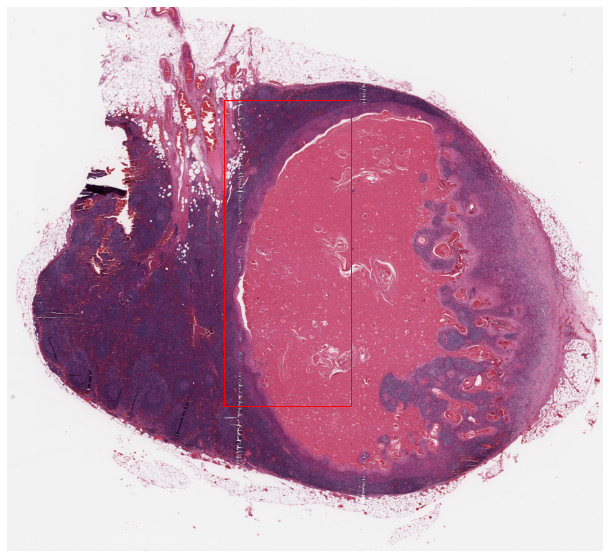

Case 24 B9_2


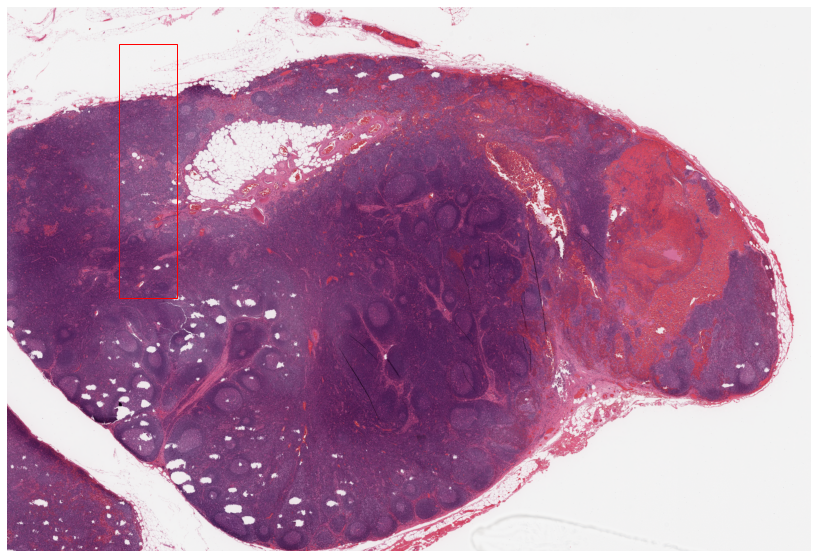

Case 24 B8_2


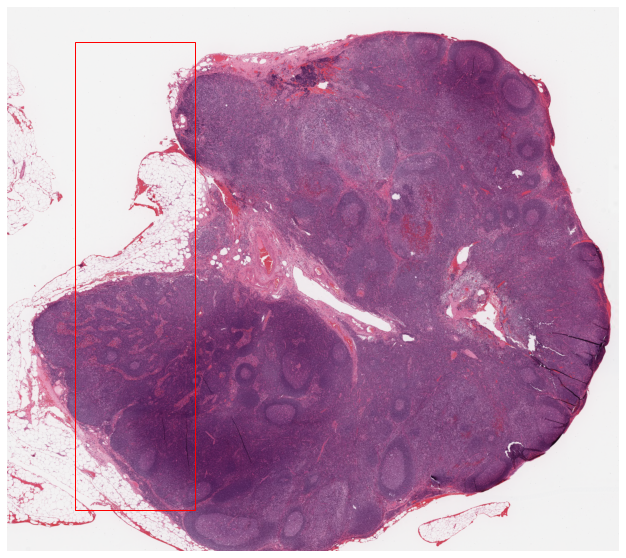

Case 6 D8_4


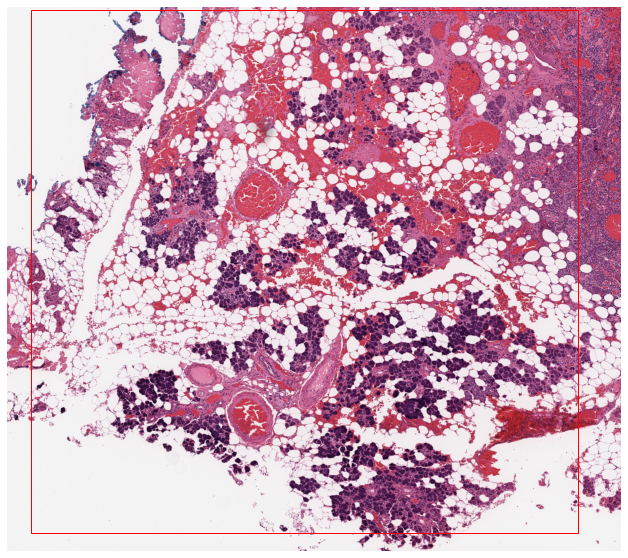

Case 22 F2_0


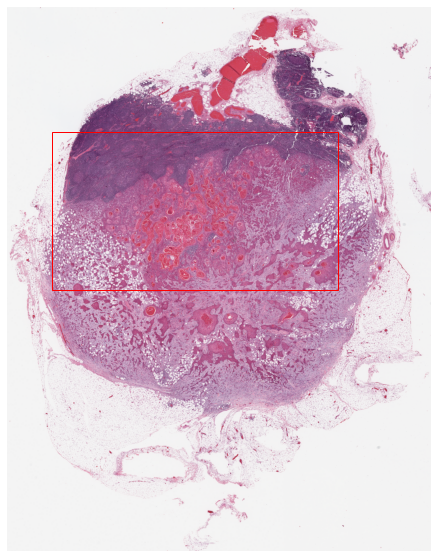

Case 5 H1_1


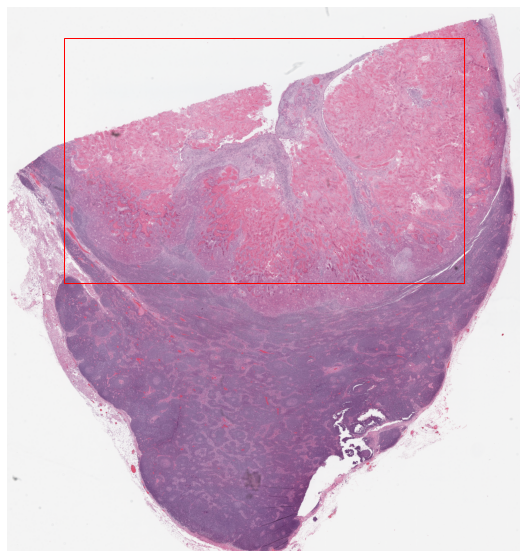

Case 14 F9_1


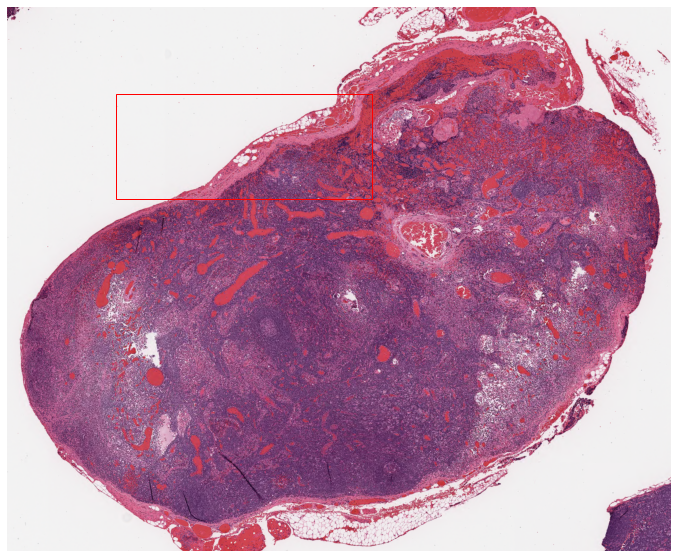

Case 2 D3_1


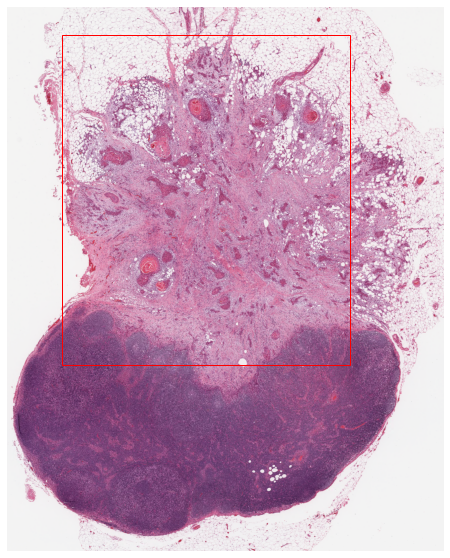

Case 4 F29_1


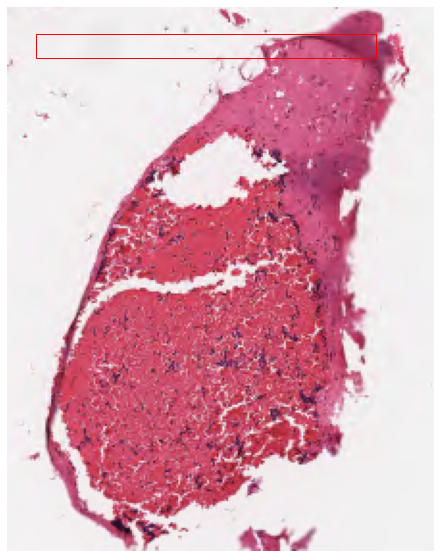

In [20]:
for pred_img in pred_img_paths:
    # find value of key in pred_box_dict
    key = os.path.basename(pred_img).split('.')[0]
    pred_boxes = [x[key] for x in pred_box_dict if key in x.keys()]
    if len(pred_boxes) > 10:
        continue
    plt.imshow(np.load(pred_img))
    plt.axis('off')
    for box in pred_boxes:
        x1, y1, x2, y2 = box
        plt.gca().add_patch(patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none'))
    print(key)
    plt.show(); plt.close()


#### More testing

In [2]:
import ubteacher.utils.eval_utils as eval_utils
from detectron2.data import build_detection_test_loader

In [17]:
model_path_parent = '/home/chao_lab/SynologyDrive/chaolab_AI_path/ROI_detection2/outputs/ROIdet-multi_20230906/'
#model_path_parent = '/home/chao_lab/SynologyDrive/chaolab_AI_path/unbiased_teacher2/completed_outputs/tcga_mix_v2.8/'
model_path = model_path_parent + 'model_0184999.pth'

In [18]:
cfg = get_cfg()
add_ubteacher_config(cfg)
cfg.DATASEED = ""
cfg.PARENTDIR = ""
cfg.CATEGORICAL_MAP = []
cfg.DETECTION_MODE = ""
cfg.MODEL.ROI_BOX_HEAD.FED_LOSS_FREQ_WEIGHT_POWER = 0.0
cfg.MODEL.ROI_BOX_HEAD.FED_LOSS_NUM_CLASSES = 1
cfg.MODEL.ROI_BOX_HEAD.USE_FED_LOSS = False
cfg.MODEL.ROI_BOX_HEAD.USE_SIGMOID_CE = False
cfg.SOLVER.BASE_LR_END = 0.005
cfg.SOLVER.NUM_DECAYS = 1
cfg.SOLVER.RESCALE_INTERVAL = False
cfg.merge_from_file(os.path.join(model_path_parent, "config.yaml"))
cfg.MODEL.WEIGHTS = model_path
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5

In [19]:
try:
    reg_name = "ROI_test"
    cat_map = {"lesion": 0}
    dataset_dir = '/mnt/MT8/SynologyDrive/SRI_OSCC_lymph_train'


    print(f"Registering dataset '{reg_name}'...")
    inf_helper = eval_utils.InferenceHelper(cfg)
    DatasetCatalog.register(
    reg_name, lambda d=reg_name: inf_helper.get_inference_dset(dataset_dir)
    )
    ROI_metadata = MetadataCatalog.get(reg_name).set(
    thing_classes=sorted(cat_map, key=cat_map.get)
    )
    cfg.DATASETS.TEST = reg_name
    print("Building dataloader for inference...")
    dataloader = build_detection_test_loader(
    cfg, cfg.DATASETS.TEST, mapper=inf_helper.inference_mapper
    )
except:
    print("Dataset already registered")
    pass

Registering dataset 'ROI_test'...
Dataset already registered


|2023-10-15|16:25:22.225| [INFO] [Checkpointer] Loading from /home/chao_lab/SynologyDrive/chaolab_AI_path/ROI_detection2/outputs/ROIdet-multi_20230906/model_0184999.pth ...
[{'instances': Instances(num_instances=1, image_height=1364, image_width=2000, fields=[pred_boxes: Boxes(tensor([[  82.8621,    0.0000, 2000.0000, 1364.0000]], device='cuda:0',
       grad_fn=<IndexBackward0>)), scores: tensor([0.9676], device='cuda:0', grad_fn=<IndexBackward0>), pred_classes: tensor([0], device='cuda:0')])}]


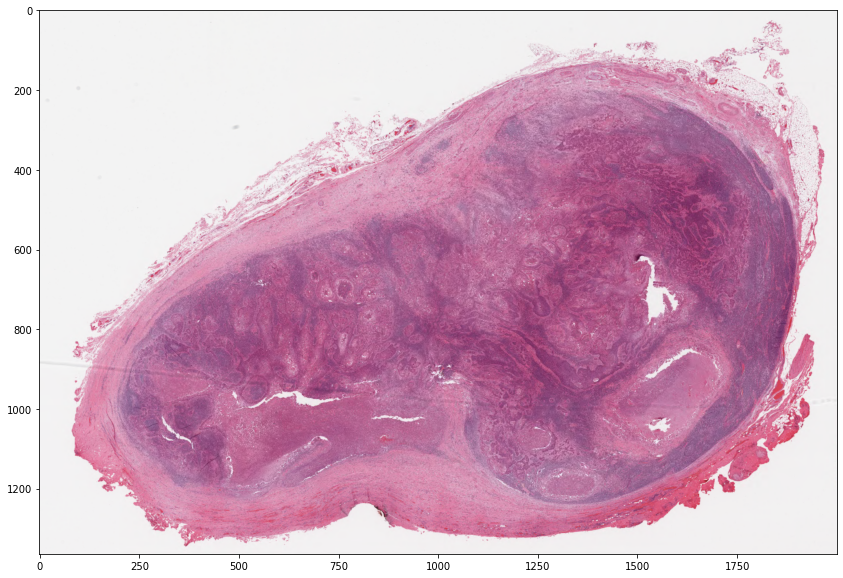

In [23]:
# Initialize the model
model = DefaultPredictor(cfg).model
eval_dataset = cfg.DATASETS.TEST
thing_classes = ROI_metadata.thing_classes

for inputs in dataloader:
    preds = model(inputs)
    print(preds)
    plt.imshow(inputs[0]['image'].permute(1, 2, 0))
    plt.show()
    plt.close()
    break